# Karl Schneider - Meteo 477 Final Project Fall 2018
## Investigating various ways to visualize data from the GOES-16 ABI in Python

The starting point of my code in this project was code written by Brian Blaylock:
https://github.com/blaylockbk/pyBKB_v2/blob/master/BB_goes16/mapping_GOES16_data.ipynb

The GOES-16 ABI (Advanced Baseline Imager) has 16 spectral bands, with central wavelengths ranging from ~0.47 micron to 13.3 micron. There are two visible bands, four near-IR bands, and ten IR bands. Information about each band can be found at: https://www.goes-r.gov/education/ABI-bands-quick-info.html 

### Accessing the data:
Data can be downloaded from the following web interface (will explore ways to automate the download process later):
http://home.chpc.utah.edu/~u0553130/Brian_Blaylock/cgi-bin/goes16_download.cgi 
I used both the band 2 (red) file and the multi-band formatted file. The CONUS domain should be used, as the full disk files are very large!

The post-processed data is available in netcdf format from the download page referenced. The post-processed data from the visible and near-IR bands (Bands 1-6) have units of albedo, so they are day-only products. The data from bands 7-16 (IR bands) are brightness temperatures, so this data will be useful during the day or at night. 

## Plotting the CONUS image:

In [2]:
# Import libraries needed
from netCDF4 import Dataset
from datetime import datetime, timedelta
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap
from pyproj import Proj

### Open the netCDF file and extract the date and time of the scan:

I use the band 2 file in this instance because it is the one used for the the most popular "visible" satellite image, and is available at 0.5km resolution, which provides a high-resolution image even for a small sub-section.

In [3]:
# Read netcdf file
# MAKE SURE TO USE THE BAND 2 FILE, NOT THE MULTI-BAND FILE 
C_file = '/home/kschneider/Downloads/OR_ABI-L2-CMIPC-M3C02_G16_s20183142057177_e20183142059550_c20183142100056.nc'
C = Dataset(C_file, 'r')

# Get date and time
add_seconds = C.variables['t'][0] # Number of seconds since year 2000
add_seconds=int(add_seconds)
DATE = datetime(2000, 1, 1, 12) + timedelta(seconds=add_seconds) # This is now formatted as a python datetime message

### Read in the data

In [4]:
# For this band, the data are albedoes, ranging from 0 to 1.
R = C.variables['CMI'][:]

# Make sure all values are between 0 and 1
R=np.clip(R, 0, 1)

# Optional: Apply a gamma correction to increase or decrease contrast between land and clouds.
# Gamma less than one will increase contrast
gamma = 0.4 # Works well in this instance
R = np.power(R, gamma)

### Plotting the image
To view the clouds and land, we can use imshow (fairly fast!). I used the colormap 'greys' (reversed), which is a popular color map for viewing cloud imagery, as we want clouds to appear white relative to the land. 

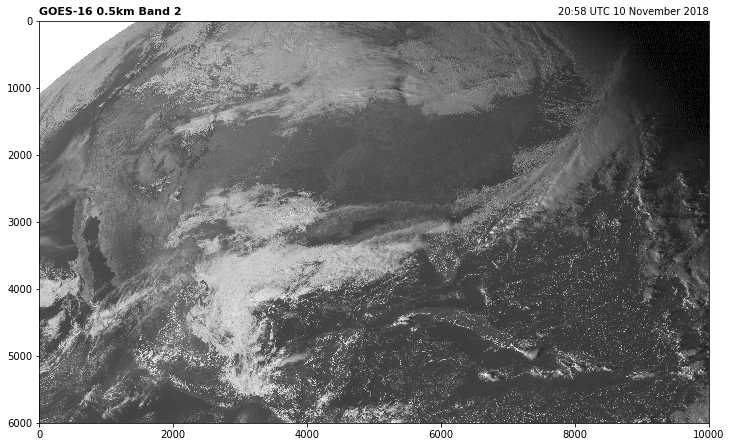

In [5]:
# Plot the image with a standard colorbar
plt.figure(figsize=[12, 9.5])
plt.imshow(R, cmap='Greys_r') # Reverse to have clouds show up as white
plt.title('GOES-16 0.5km Band 2', loc='left', fontweight='semibold', fontsize=11)
plt.title('%s' % DATE.strftime('%H:%M UTC %d %B %Y'), loc='right', fontsize=10) # Stating the date/time of image
plt.show()

I don't find these images particularly useful without a basemap, so we must add some code to accomplish that. The GOES-16 satellite has a unique projection (as you can see the curvature of the Earth in the above image). Fortunately, matplotlib's basemap library allows you to plot a basemap on a geostationary projection! 

### Adding a basemap:

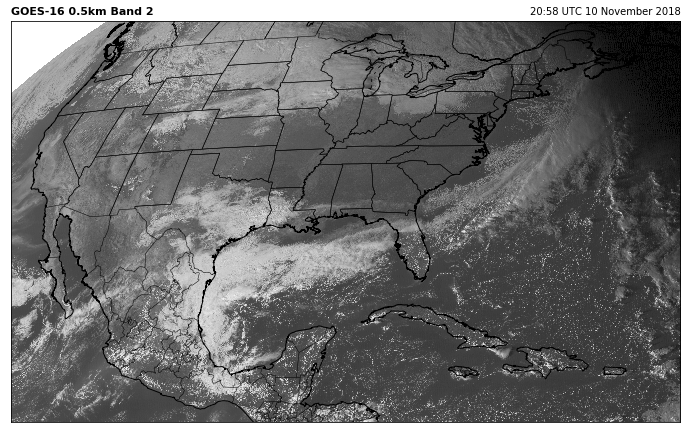

In [7]:
# Grab the variables we need
sat_h = C.variables['goes_imager_projection'].perspective_point_height
sat_lon = C.variables['goes_imager_projection'].longitude_of_projection_origin

# The projection x and y coordinates equals
X = C.variables['x'][:] * sat_h
Y = C.variables['y'][:] * sat_h

# The basemap
m = Basemap(projection='geos', lon_0=sat_lon,
            resolution='i', area_thresh=5000,
            llcrnrx=X.min(),llcrnry=Y.min(),
            urcrnrx=X.max(),urcrnry=Y.max())

plt.figure(figsize=[12, 9.5])
m.imshow(np.flipud(R), cmap='Greys_r') # Need to flip up/down because images are upside-down in basemap
m.drawcoastlines()
m.drawcountries()
m.drawstates()

plt.title('GOES-16 0.5km Band 2', loc='left', fontweight='semibold', fontsize=11)
plt.title('%s' % DATE.strftime('%H:%M UTC %d %B %Y'), loc='right', fontsize=10)
plt.show()

### Projecting into a different map projection
Notice that in the image above, we can't see the western half of the US very well, as the Earth curves away from the satellite's perspective. How do we see these regions more clearly and achieve a flat, clean-looking image? To accomplish this, I used the Lambert Conformal Conic projection. Many other projections are available thru the basemap library, and I have demonstrated the use of others in later sections.

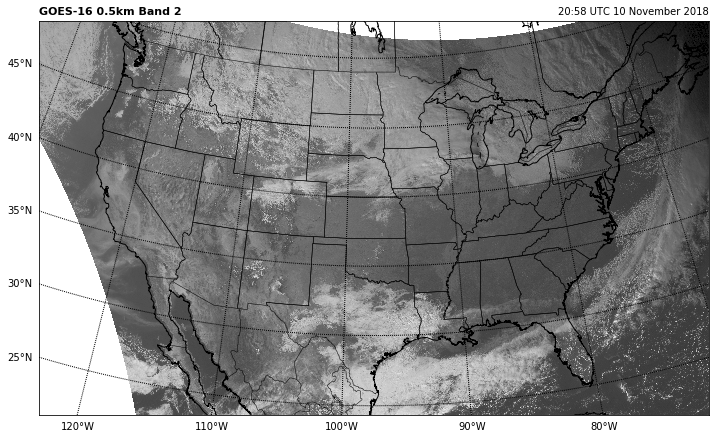

In [10]:
# Satellite sweep
sat_sweep = C.variables['goes_imager_projection'].sweep_angle_axis

# using the Proj library to generate map object
p = Proj(proj='geos', h=sat_h, lon_0=sat_lon, sweep=sat_sweep)

# Convert map points to latitude and longitude
XX, YY = np.meshgrid(X, Y)
lons, lats = p(XX, YY, inverse=True)

# Important: Set the "Outer Space" pixels to a point in the Gulf of Alaska
# Without this, re-projections will appear distorted 
lats[R.mask] = 57
lons[R.mask] = -152

# Make a new map object for CONUS Lambert Conformal Conic Projection
mH = Basemap(resolution='i', projection='lcc', area_thresh=5000, \
             width=1800*3000, height=1060*3000, \
             lat_1=38.5, lat_2=38.5, \
             lat_0=38.5, lon_0=-97.5)

# Plot the image
plt.figure(figsize=[12, 9.5])
# Using pcolormesh instead of imshow because we need to use lat/lon arrays in this case
newmap = mH.pcolormesh(lons, lats, R, cmap='Greys_r', linewidth=0, latlon=True)
mH.drawcoastlines()
mH.drawcountries()
mH.drawstates()
# Optional: draw some parallels and meridians: labels = [left,right,top,bottom]
parallels = np.arange(0.,81,5.)
mH.drawparallels(parallels,labels=[True,False,False,False])
meridians = np.arange(10.,351.,10.)
mH.drawmeridians(meridians,labels=[False,False,False,True])

plt.title('GOES-16 0.5km Band 2', fontweight='semibold', fontsize=11, loc='left')
plt.title('%s' % DATE.strftime('%H:%M UTC %d %B %Y'), loc='right', fontsize='10')
plt.show()

### Viewing a sub-region
It's often useful to view a smaller region, so let's zoom in on the Mid-Atlantic. Notice that because of the high resolution of this file, the image does not have a blocky or pixelated appearance. The downside of this, however, is that it does take quite a bit of time to generate the plot. Images can be generatd much faster by using the 2.0km resolution, described in the next step.


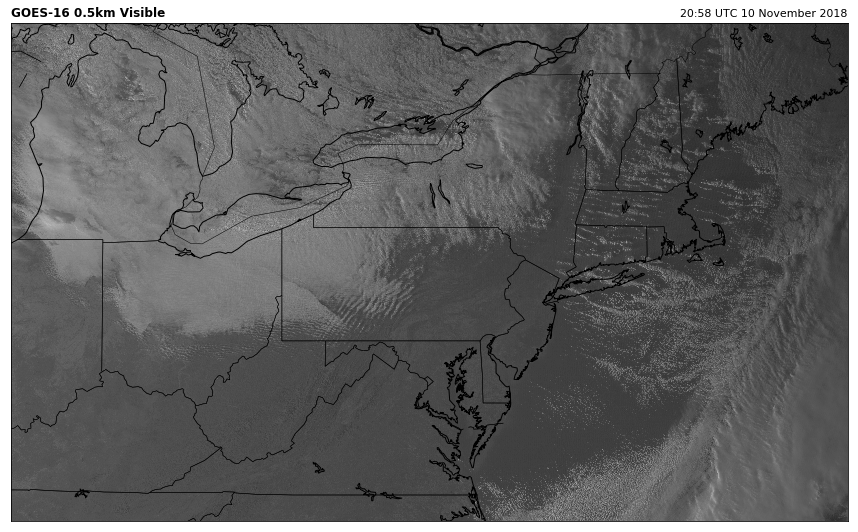

In [20]:
mZ = Basemap(projection='mill', llcrnrlon=-87, \
    urcrnrlon=-67, llcrnrlat=36, \
    urcrnrlat=46, resolution='i')

lon, lat = mZ(lons, lats) # Convert lat and lon to map coordinates, because this projection seems to require that

plt.figure(figsize=[15,12])
mZ.pcolormesh(lon, lat, R, cmap='Greys_r', linewidth=0) # Can't use latlon = true here, not sure why.
mZ.drawcoastlines()
mZ.drawcountries()
mZ.drawstates()
plt.title('GOES-16 0.5km Visible', loc='left', fontweight='semibold', fontsize=12)
plt.title('%s' % DATE.strftime('%H:%M UTC %d %B %Y'), loc='right', fontsize=11)
plt.show()

## Overlay Night IR with Visible
The downside to visible satellite imagery is that it's only useful during the day. Overlaying the IR imagery still provides useful information at night, while keeping details such as low clouds that the visible imagery can pick out during the daytime hours. 

For this step and beyond, I used the multi-band file, which contains all 16 spectral bands at 2.0km resolution (at below satellite point). The data might appear a bit blocky if you zoom in close on Pennsylvania, but for synoptic-scale purposes, this is a decent look. 

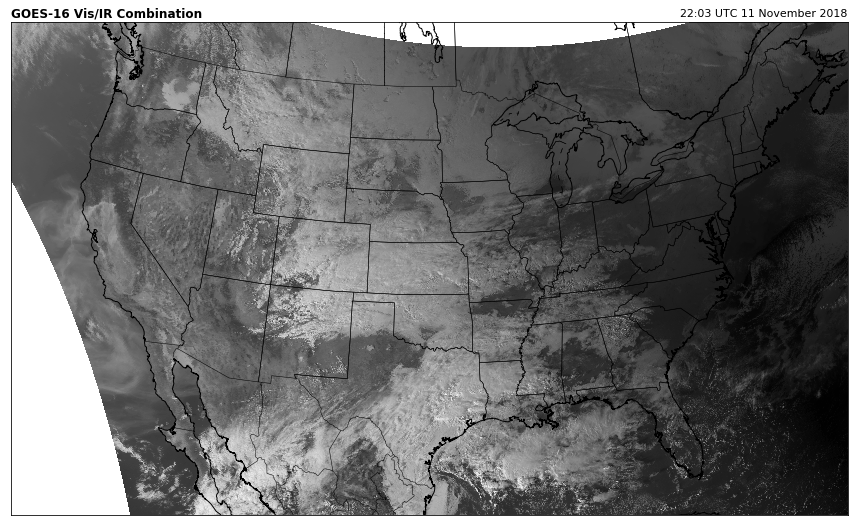

In [12]:
# Read netcdf file
C_file = '/home/kschneider/Downloads/OR_ABI-L2-MCMIPC-M3_G16_s20183152202172_e20183152204545_c20183152205060.nc'
C = Dataset(C_file, 'r')

# Get date and time
add_seconds = C.variables['t'][0] # Number of seconds since year 2000
add_seconds=int(add_seconds)
DATE = datetime(2000, 1, 1, 12) + timedelta(seconds=add_seconds)

# Load the Visible and clean IR bands
R = C.variables['CMI_C02'][:]
cleanIR = C.variables['CMI_C13'][:]

# Apply the gamma correction to Visible
gamma = 0.4
R = np.power(R, gamma)

# Apply range limits for clean IR channel
cleanIR=np.clip(cleanIR,90,313)

# Normalize the channel between a range
cleanIR = (cleanIR-90)/(313-90)

# Invert colors to match visible channel 
cleanIR = 1 - cleanIR

# Combine
Vis_IR = np.maximum(R, cleanIR)

# Basemap
# Satellite height, lon, sweep
sat_h = C.variables['goes_imager_projection'].perspective_point_height
sat_lon = C.variables['goes_imager_projection'].longitude_of_projection_origin
sat_sweep = C.variables['goes_imager_projection'].sweep_angle_axis

# The projection x and y coordinates
X = C.variables['x'][:] * sat_h
Y = C.variables['y'][:] * sat_h

# using the Proj library to generate map object
p = Proj(proj='geos', h=sat_h, lon_0=sat_lon, sweep=sat_sweep)

# Convert map points to latitude and longitude
XX, YY = np.meshgrid(X, Y)
lons, lats = p(XX, YY, inverse=True)

# Important: Set the "Outer Space" pixels to a point in the Gulf of Alaska
# Without this, re-projections will appear distorted 
lats[R.mask] = 57
lons[R.mask] = -152

# Make a new map object for CONUS Lambert Conformal Conic Projection
mH = Basemap(resolution='i', projection='lcc', area_thresh=5000, \
             width=1800*3000, height=1060*3000, \
             lat_1=38.5, lat_2=38.5, \
             lat_0=38.5, lon_0=-97.5)

# Plot the image
plt.figure(figsize=[15,12])
# Using pcolormesh instead of imshow because we need to use lat/lon arrays in this case
newmap = mH.pcolormesh(lons, lats, Vis_IR, cmap='Greys_r', linewidth=0, latlon=True)
mH.drawcoastlines()
mH.drawcountries()
mH.drawstates()

plt.title('GOES-16 Vis/IR Combination', fontweight='semibold', fontsize=12, loc='left')
plt.title('%s' % DATE.strftime('%H:%M UTC %d %B %Y'), fontsize=11, loc='right')
plt.show()

## RGB Color Composites
These are an extremely useful way to pick out features using multiple spectral bands. RGB composites are created in python by stacking three arrays corresponding to the red, blue, and green components of the color of each pixel to create a color tuple. Often, you'll see RGB values are defined from 0 to 255 (in a program such as photoshop, etc), but python expects the values to range from 0 to 1 (which makes it easy, in this case). The RGB composites made from GOES-16 ABI data typically use a different band for each R, G, and B component in order to identify features such as snow cover, cloud height, smoke, etc, as certain particles are more or less reflective in different bands. A few examples of RGB composites I've coded are below.  
### Cloud Top Height
This product is used by the National Weather Service in their AWIPS-II system to help forecasters identify the height of cloud structures seen on the visible imagery. I constructed this composite according to the recipe found here: http://rammb.cira.colostate.edu/training/visit/quick_guides/Day_Cloud_Phase_Distinction.pdf

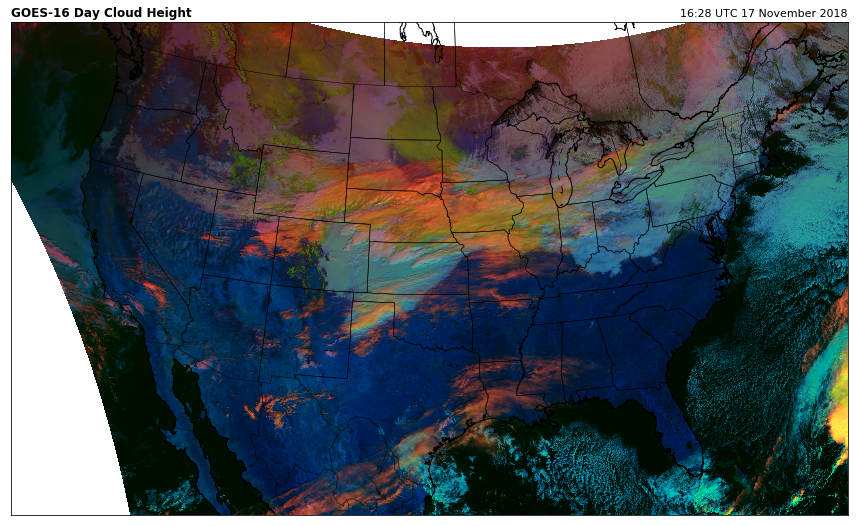

In [18]:
# Read netcdf file
C_file = '/home/kschneider/Downloads/OR_ABI-L2-MCMIPC-M3_G16_s20183211627149_e20183211629522_c20183211630029.nc'
C = Dataset(C_file, 'r')

# Get date and time
add_seconds = C.variables['t'][0] # Number of seconds since year 2000
add_seconds=int(add_seconds)
DATE = datetime(2000, 1, 1, 12) + timedelta(seconds=add_seconds)

# Load the RGB arrays
R = C.variables['CMI_C13'][:] # IR Band 13
G = C.variables['CMI_C02'][:] # "Red" Band 2 visible
B = C.variables['CMI_C05'][:] # "Snow/Ice" Band 5

# Apply range limits for each channel 
G = np.clip(G, 0, .78) # These are albedo (range from 0 to 1)
B = np.clip(B, .01, .59)
# Normalize between 0 and 1
G = (G-0)/(.78-0)
B = (B-.01)/(0.59--0.01)
# Range limits for IR channel
Rmin=219.65 # Kelvin
Rmax=280.65
R = np.clip(R, Rmin, Rmax)
R = (R-Rmin)/(Rmax-Rmin) # Normalize between the range
R = 1. - R # Make cold brightness temperatures appear red

# The final RGB array :)
RGB = np.dstack([R,G,B])

# Satellite height, lon, sweep
sat_h = C.variables['goes_imager_projection'].perspective_point_height
sat_lon = C.variables['goes_imager_projection'].longitude_of_projection_origin
sat_sweep = C.variables['goes_imager_projection'].sweep_angle_axis

# The projection x and y coordinates 
X = C.variables['x'][:] * sat_h
Y = C.variables['y'][:] * sat_h

# map object with pyproj
p = Proj(proj='geos', h=sat_h, lon_0=sat_lon, sweep=sat_sweep)

# Convert map points to latitude and longitude with the magic provided by Pyproj
XX, YY = np.meshgrid(X, Y)
lons, lats = p(XX, YY, inverse=True)
# Important: convert points where R is masked to be a point in the gulf of alaska
lats[R.mask] = 57
lons[R.mask] = -152

# Make a new map object for the CONUS
mH = Basemap(resolution='i', projection='lcc', area_thresh=5000, \
             width=1800*3000, height=1060*3000, \
             lat_1=38.5, lat_2=38.5, \
             lat_0=38.5, lon_0=-97.5)

# Create a color tuple for pcolormesh
rgb = RGB[:,:-1,:]
colorTuple = rgb.reshape((rgb.shape[0] * rgb.shape[1]), 3) # flatten array
colorTuple = np.insert(colorTuple, 3, 1.0, axis=1) # adding an alpha channel plots faster

# Plot the image
plt.figure(figsize=[15,12])
# Using pcolormesh instead of imshow because we need to use lat/lon arrays in this case
newmap = mH.pcolormesh(lons, lats, R, color=colorTuple, linewidth=0, latlon=True)
newmap.set_array(None)
mH.drawcoastlines()
mH.drawcountries()
mH.drawstates()

plt.title('GOES-16 Day Cloud Height', fontweight='semibold', fontsize=12, loc='left')
plt.title('%s' % DATE.strftime('%H:%M UTC %d %B %Y'), fontsize=11, loc='right')
plt.show()

Red colors in the above image correspond to cold ice clouds or cold land, as the red component comes from the clean IR band, reversed. Thus, regions with cold brightness temperatures will have a large red component. The green component comes from the visible band, and the blue component comes from the snow/ice band. Both of these bands are albedoes, as opposed to brightness temperatures. Thus, blue colors will correspond to bare land and liquid clouds, as snow and ice are not reflective in the snow/ice band. Greens/yellows indicate the presence of snow cover or mixed-phase clouds, while whiteish-blue colors correspond to primarily warm, liquid clouds.

It's also important to keep in mind that this is a day-only product, as both the visible band and snow/ice band will be zero at night. Additionally, this product may struggle in winter, when snow cover/land may have similar brightness temperatures to ice clouds.

### Snow Cover
I thought it would be useful to create a product that identifies snow cover from the GOES-16 imagery. The snow/ice band fact sheet states that a common RGB color composite for identifying snow cover combines the visible band (red) and the snow/ice band (green and blue). Red shades indicate features that are more reflective in the 0.64 μm visible 
band, whereas cyan areas are more reflective in the 1.6 μm (snow/ice) band.
https://www.goes-r.gov/education/docs/ABI-bands-FS/ABI_Band%205_snow-ice_factsheet_FINAL.pdf

The initial result is shown below:

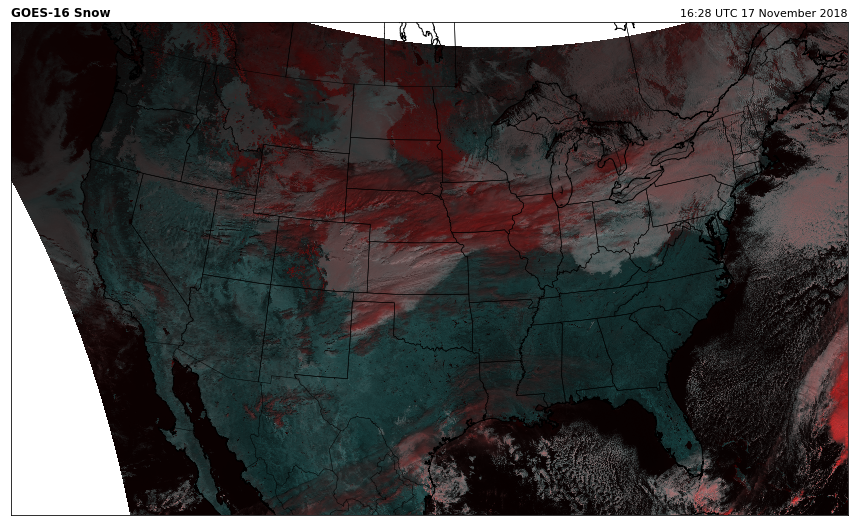

In [15]:
# Load the RGB arrays
R = C.variables['CMI_C02'][:]
G = C.variables['CMI_C05'][:]
B = C.variables['CMI_C05'][:]

# Apply range limits for each channel becuase RGB values must be between 0 and 1
R=np.clip(R, 0, 1)
G=np.clip(G, 0, 1)
B=np.clip(B, 0, 1)

# Make a new map object for CONUS Lambert Conformal Conic Projection
mH = Basemap(resolution='i', projection='lcc', area_thresh=5000, \
             width=1800*3000, height=1060*3000, \
             lat_1=38.5, lat_2=38.5, \
             lat_0=38.5, lon_0=-97.5)


# Create a color tuple for pcolormesh
RGB = np.dstack([R,G,B])
rgb = RGB[:,:-1,:] # Using one less column is very imporant, else your image will be scrambled! (This is the stange nature of pcolormesh)
colorTuple = rgb.reshape((rgb.shape[0] * rgb.shape[1]), 3) # flatten array, becuase that's what pcolormesh wants.
colorTuple = np.insert(colorTuple, 3, 1.0, axis=1) # adding an alpha channel will plot faster, according to stackoverflow. Not sure why.

# Plot the image
plt.figure(figsize=[15,12])
# Using pcolormesh instead of imshow because we need to use lat/lon arrays in this case
newmap = mH.pcolormesh(lons, lats, R, color=colorTuple, linewidth=0, latlon=True)
newmap.set_array(None)
mH.drawcoastlines()
mH.drawcountries()
mH.drawstates()

plt.title('GOES-16 Snow', fontweight='semibold', fontsize=12, loc='left')
plt.title('%s' % DATE.strftime('%H:%M UTC %d %B %Y'), fontsize=11, loc='right')
plt.show()

This worked well, aside from one major issue. We see that the land appears blue/green, which is what we expect given that it is more reflective in the snow/ice (1.6 μm) band. Thus, all regions that contain notable amounts of red color have ice present. We see snow cover from southwestern MN to southern SK/AB, but what about all the red color in NE/IA? These are cirrus clouds (as we can see by the wispy structure), primarily composed of ice, so they are being confused with snow cover. How do we address this? The GOES-16 ABI does have a cirrus band, so through a good bit of trial and error I created a "cirrus mask" to get rid of (most) of these pesky high clouds. 

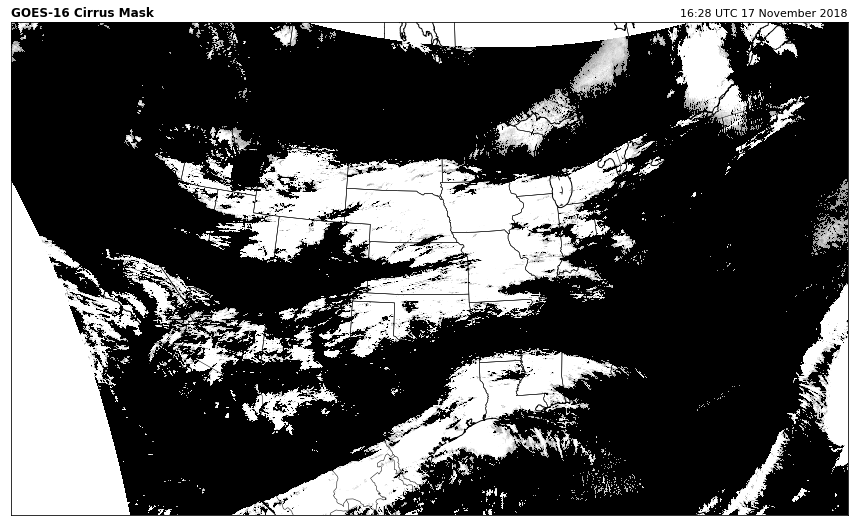

In [16]:
# Cirrus
CI = C.variables['CMI_C04'][:]

# Arbitrary thresholding
CI = np.clip(CI, 0, 0.02) 
CI[CI<0.01] = 0

# Make a new map object for CONUS Lambert Conformal Conic Projection
mH = Basemap(resolution='i', projection='lcc', area_thresh=5000, \
             width=1800*3000, height=1060*3000, \
             lat_1=38.5, lat_2=38.5, \
             lat_0=38.5, lon_0=-97.5)

# Plot the image
plt.figure(figsize=[15,12])
# Using pcolormesh instead of imshow because we need to use lat/lon arrays in this case
newmap = mH.pcolormesh(lons, lats, CI, cmap='Greys_r', linewidth=0, latlon=True)
mH.drawcoastlines()
mH.drawcountries()
mH.drawstates()

plt.title('GOES-16 Cirrus Mask', fontweight='semibold', fontsize=12, loc='left')
plt.title('%s' % DATE.strftime('%H:%M UTC %d %B %Y'), fontsize=11, loc='right')
plt.show()

To apply the cirrus mask, I simply multiplied it by ten to scale the values to the values of the Visible band, and subtracted it. 
The result:

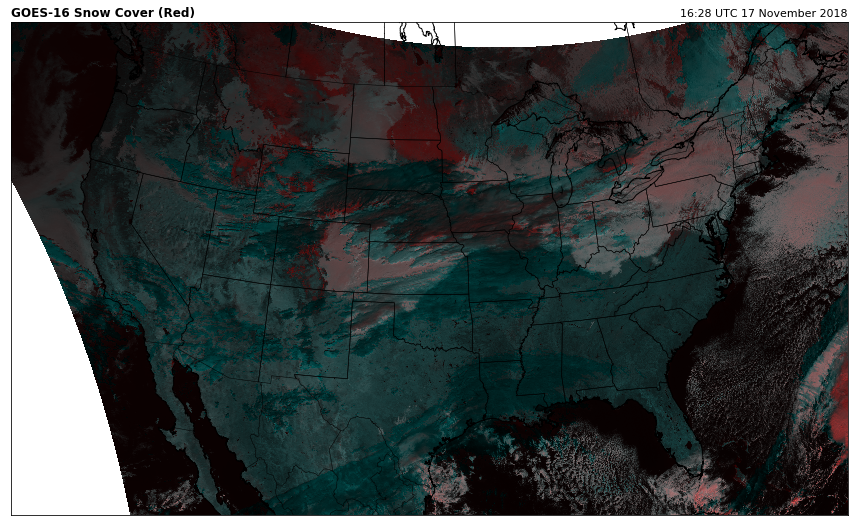

In [17]:
# Load the RGB arrays
VIS = C.variables['CMI_C02'][:]
G = C.variables['CMI_C05'][:]
B = C.variables['CMI_C05'][:]

# Cirrus
CI = C.variables['CMI_C04'][:]
CI = np.clip(CI, 0, 0.02)
CI[CI<0.01] = 0

# Apply cirrus mask
R = VIS - CI*10.

R=np.clip(R, 0, 1)
G=np.clip(G, 0, 1)
B=np.clip(B, 0, 1)

# Make a new map object for CONUS Lambert Conformal Conic Projection
mH = Basemap(resolution='i', projection='lcc', area_thresh=5000, \
             width=1800*3000, height=1060*3000, \
             lat_1=38.5, lat_2=38.5, \
             lat_0=38.5, lon_0=-97.5)


# Create a color tuple for pcolormesh
RGB = np.dstack([R,G,B])
rgb = RGB[:,:-1,:] # Using one less column is very imporant, else your image will be scrambled! (This is the stange nature of pcolormesh)
colorTuple = rgb.reshape((rgb.shape[0] * rgb.shape[1]), 3) # flatten array, becuase that's what pcolormesh wants.
colorTuple = np.insert(colorTuple, 3, 1.0, axis=1) # adding an alpha channel will plot faster, according to stackoverflow. Not sure why.

# Plot the image
plt.figure(figsize=[15,12])
# Using pcolormesh instead of imshow because we need to use lat/lon arrays in this case
newmap = mH.pcolormesh(lons, lats, R, color=colorTuple, linewidth=0, latlon=True)
newmap.set_array(None)
#newmap = mH.pcolormesh(lons, lats, R, cmap='Greys_r', linewidth=0, latlon=True)
mH.drawcoastlines()
mH.drawcountries()
mH.drawstates()

plt.title('GOES-16 Snow Cover (Red)', fontweight='semibold', fontsize=12, loc='left')
plt.title('%s' % DATE.strftime('%H:%M UTC %d %B %Y'), fontsize=11, loc='right')
plt.show()

Now, most of the cirrus clouds have been masked! Now we clearly see regions of snow cover through the various cloud layers. 

## Working with IR data - Custom Color Maps
Utilizing colorful custom color maps rather than the default python 'greys' color map can bring out a lot of useful information from a particular image. Here's an example of the difference between water vapor imagery in greys versus the use of a custom-generated colormap. 

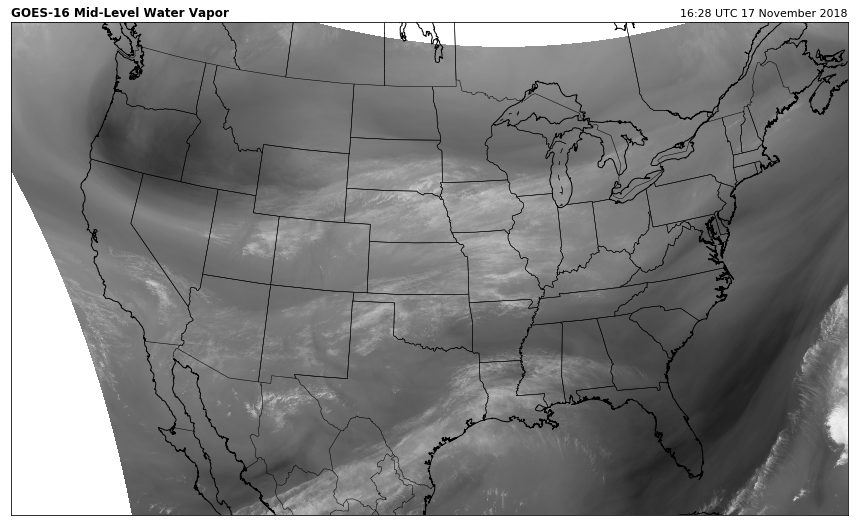

In [21]:
# Load Water Vapor Bands, these are brightness temperatures 
LL = C.variables['CMI_C08'][:] # Low-Level
ML = C.variables['CMI_C09'][:] # Mid-Level
UL = C.variables['CMI_C10'][:] # Upper-Level

# Make a new map object for the CONUS
mH = Basemap(resolution='i', projection='lcc', area_thresh=5000, \
             width=1800*3000, height=1060*3000, \
             lat_1=38.5, lat_2=38.5, \
             lat_0=38.5, lon_0=-97.5)

# Plot the image
plt.figure(figsize=[15,12])
# Using the Mid-Level water vapor in this case
newmap = mH.pcolormesh(lons, lats, ML, cmap='Greys', linewidth=0, latlon=True)
mH.drawcoastlines()
mH.drawcountries()
mH.drawstates()

plt.show()

Decent enough, but this could use a more colorful scheme. Presented below is a method of creating custom color maps in python. I use this function frequently, and store it in another script so I can call it whenever I need to use it. 
http://schubert.atmos.colostate.edu/~cslocum/custom_cmap.html

In [22]:
# Custom colormap function by Chris Slocum
def make_cmap(colors, position=None, bit=False):
    import matplotlib as mpl
    bit_rgb = np.linspace(0,1,256)
    if position == None:
        position = np.linspace(0,1,len(colors))
    else:
        if len(position) != len(colors):
            sys.exit("position length must be the same as colors")
        elif position[0] != 0 or position[-1] != 1:
            sys.exit("position must start with 0 and end with 1")
    if bit:
        for i in range(len(colors)):
            colors[i] = (bit_rgb[colors[i][0]],
                         bit_rgb[colors[i][1]],
                         bit_rgb[colors[i][2]])
    cdict = {'red':[], 'green':[], 'blue':[]}
    for pos, color in zip(position, colors):
        cdict['red'].append((pos, color[0], color[0]))
        cdict['green'].append((pos, color[1], color[1]))
        cdict['blue'].append((pos, color[2], color[2]))

    cmap = mpl.colors.LinearSegmentedColormap('my_colormap',cdict,256)
    return cmap

Now, we will call the function above in order to create a custom colormap for the data. The colormap function takes colors in RGB triples, where values of R, G, and B range from 0 to 255 (not 0 to 1 like pcolormesh's color tuples). For each RGB triple, there is a corresponding position on the colorbar. The colormap function will interpolate the colors in between the values you choose. To determine the position of each color, you first must know the intended range of your colorbar (for example, 160K to 330K). Then, you must find out what temperature corresponds to a position on the colormap. The easiest way to do this is in excel, where you must normalize the range from 150-300K to 0 to 1. Then, you will have a value of position for each brightness temperature.

Here's an example of what I've done to calculate my positions: https://docs.google.com/spreadsheets/d/17BZO5Mp7hI4Hs1oFSKH7EvwXcX1wnv4oatR2jIvhWpA/edit?usp=sharing


In [23]:
# Color map generation: colors = RGB values, positon = 0 to 1, where 0 is bottom of bar
colors = [(0,0,0), (65,130,30), (255,255,255), (0,0,115), (255,255,0), (255,0,0), (0,0,0)]
# positions[160K 210K 230K 250K 260K 275K 330K]
position = [0, .29, .41, .53, .59, .68, 1]
my_cmap = make_cmap(colors, position=position, bit=True)

Here, I've coded the famous water vapor color map used by many agencies. The easiest way to find the RGB triples is using a color picker tool with the eyedropper tool (I use colorcop). Find an image with a colorbar you like, and you're in business!

Here's an example of the color map I used:
https://whirlwind.aos.wisc.edu/~wxp/goes16/wvl/conus/latest_conus_1.jpg

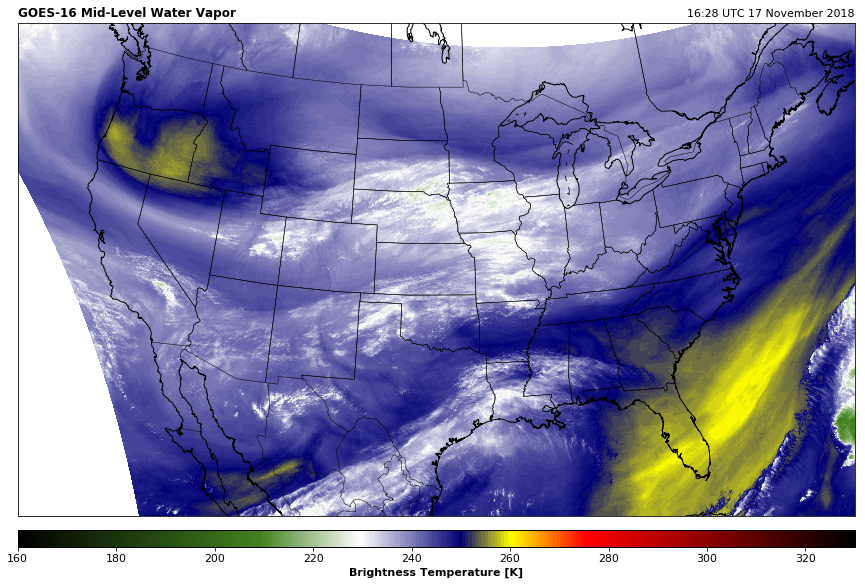

In [24]:
# Plot the image
fig = plt.figure(figsize=[15,12])
# Using pcolormesh instead of imshow because we need to use lat/lon arrays in this case
newmap = mH.pcolormesh(lons, lats, ML, cmap=my_cmap, linewidth=0, latlon=True)
mH.drawcoastlines()
mH.drawcountries()
mH.drawstates()

# Draw a colorbar
plt.clim(160,330) #IMPORTANT: SET COLORMAP LIMITS
cb = mH.colorbar(location='bottom')
# Make the colorbar more appealing
cb.ax.set_aspect(.02) # Make it skinnier than the default
cb.outline.set_linewidth(1) # Set border width to match plot
cb.ax.set_xticklabels(cb.ax.get_xticklabels(), fontsize=11) # Tick label size
cb.set_label(label='Brightness Temperature [K]',weight='bold',fontsize=11) # Colorbar title size

plt.show()

Wow, what a difference! The colors chosen for this table logically follow the amount of water vapor detected in this bamd. Green/white colors correspond to low brightness temperatures, meaning emission from water vapor high in the cold upper-troposphere. The high brightness temperatures correspond to the "dry" air, where water vapor is limited in the mid/upper troposphere, and thus we recieve emission from warm water vapor near the surface. 

## IR Color Table
This is also a popular color map used by the NWS, among others. 

In [25]:
LWIR = C.variables['CMI_C14'][:] # Longwave IR window

# Color map generation: colors = RGB values, positon = 0 to 1, where 0 is bottom of bar
colors = [(255,255,255), (255,255,0), (140,25,115), (255,125,200),(255,255,255), (0,0,0), \
          (255,0,0), (255,255,0), (0,255,0), (0,0,115), (0,255,255), (200,200,200), (0,0,0)]
# positions[160K 180K/180K 190K/190K 203K 210K 220K 230K 243K 253K/253K 330K]
position = [0, .12, .120001, .18, .180001, .25, .29, .35, .41, .49, .55, .550001, 1]
my_cmap = make_cmap(colors, position=position, bit=True)

In this case, the colormap requires sharp gradient stops at certain brightness temperatures. To accomplish this, I just set the positions of the two opposing colors very close to one another (.000001 difference). 

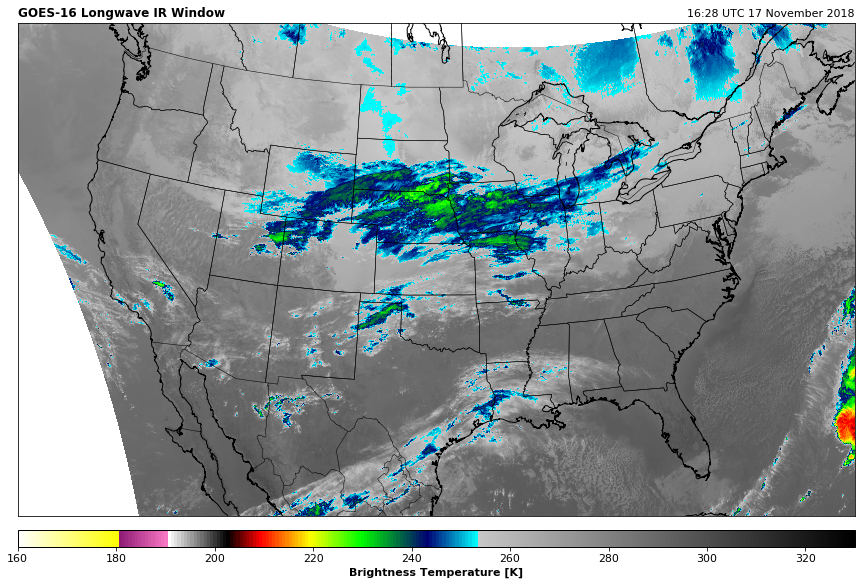

In [26]:
# Plot the image
fig = plt.figure(figsize=[15,12])
# Using pcolormesh instead of imshow because we need to use lat/lon arrays in this case
newmap = mH.pcolormesh(lons, lats, LWIR, cmap=my_cmap, linewidth=0, latlon=True)
mH.drawcoastlines()
mH.drawcountries()
mH.drawstates()

# Draw a colorbar
plt.clim(160,330) #IMPORTANT: SET COLORMAP LIMITS
cb = mH.colorbar(location='bottom')
# Make the colorbar more appealing
cb.ax.set_aspect(.02) # Make it skinnier than the default
cb.outline.set_linewidth(1) # Set border width to match plot
cb.ax.set_xticklabels(cb.ax.get_xticklabels(), fontsize=11) # Tick label size
cb.set_label(label='Brightness Temperature [K]',weight='bold',fontsize=11) # Colorbar title size

plt.show()

## Python Scripts For Operational Tasks
I always like there to be a usefulness to the code I create. In this case, why keep viewing old images, when we can view the current imagery at any time? Described below is the method I created from scratch to produce animated gifs, updating every 5 minutes, of my favorite GOES-16 products. The gifs are then uploaded to the web for viewing pleasure!

Overview of the procedure used:
1. Identify and download the most recent file from the web (do this every 5 minutes as this is when the data updates).
2. Save the most recent image until x number of images accumulate. Every time a new image is created, change the names of the previous images to keep consistency. 
3. Make an animated gif of the images. 
4. Upload to web!

#### Step 1: Download the most recent netcdf file

In [27]:
# Downloading the most recent GOES-16 multi-band file from AWS
# To do this, we will filter the links on Brian Blaylock's webpage with BeautifulSoup
from bs4 import BeautifulSoup
import urllib2
from datetime import datetime, timedelta
from time import sleep

# Start a while loop to catch any errors within the downloaded netcdf file
loop = True
while loop: 
    # We need to create the url to go fetch the file

    # Get current UTC time
    time = datetime.utcnow()
    date = datetime.strftime(time, '%Y-%m-%d')
    hour = datetime.strftime(time, '%H')

    # Make the URL based on the current date and time
    main = 'http://home.chpc.utah.edu/~u0553130/Brian_Blaylock/cgi-bin/goes16_download.cgi?source=aws&domain=C&product=ABI-L2-MCMIP&date='
    url = main + date + '&hour=' + hour
    html = urllib2.urlopen(url).read()
    soup = BeautifulSoup(html)
    stuff = soup.select('a[href*=noaa-goes16.s3.amazonaws.com]') # Select links from the webpage that are to the AWS server

    # What about if the first file for the current hour hasn't been uploaded yet (a problem from xx:00 to xx:05 or so)
    try:
        latest_url = stuff[-1]['href'] # Selecting the the last link in the list as it will be the most recent 
    except:
        delta = timedelta(hours=1)
        time = datetime.utcnow() - delta # Go back to the previous hour
        date = datetime.strftime(time, '%Y-%m-%d')
        hour = datetime.strftime(time, '%H')

        url = main + date + '&hour=' + hour
        html = urllib2.urlopen(url).read()
        soup = BeautifulSoup(html)
        stuff = soup.select('a[href*=noaa-goes16.s3.amazonaws.com]')

        latest_url = stuff[-1]['href']

    # file to be written to
    file = 'file.nc'
    fh = open(file, 'w')
    response = urllib2.urlopen(latest_url)
    print 'Latest url:' + latest_url
    fh.write(response.read())
    fh.close()

    from netCDF4 import Dataset
    C_file = file
    C = Dataset(C_file, 'r')
    try:
        print 'Testing file...'
        B = C.variables['CMI_C16'][:]
        loop = False
    except:
        print 'Corrupted netCDF file, trying again in 30 seconds'
        sleep(30)

print 'Download successful!'

Latest url:https://noaa-goes16.s3.amazonaws.com/ABI-L2-MCMIPC/2018/343/19/OR_ABI-L2-MCMIPC-M3_G16_s20183431942183_e20183431944556_c20183431945066.nc
Testing file...
Download successful!


The download is successful and the file has been saved as 'file.nc' (doesn't matter what it is named). The script above can be run every 5 minutes to download the new netcdf file, and it will overwrite the old one. To make the scripts operational so I can put them in the crontab, I define a function for each product. Then, I call the function from the main script that goes in the crontab, and it will save the image to a file. 

In [28]:
def cloudphase(url):
    
    from netCDF4 import Dataset
    from datetime import datetime, timedelta
    import numpy as np
    import matplotlib.pyplot as plt
    from mpl_toolkits.basemap import Basemap
    from pyproj import Proj

    # Read netcdf file
    C_file = url
    C = Dataset(C_file, 'r')

    # Get date and time
    add_seconds = C.variables['t'][0] # Number of seconds since year 2000
    add_seconds=int(add_seconds)
    DATE = datetime(2000, 1, 1, 12) + timedelta(seconds=add_seconds)

    # Load the RGB arrays
    R = C.variables['CMI_C13'][:] # IR Band 13
    G = C.variables['CMI_C02'][:] # "Red" Band 2 visible
    B = C.variables['CMI_C05'][:] # "Snow/Ice" Band 5

    # Apply range limits for each channel 
    G = np.clip(G, 0, .78) # These are albedo (range from 0 to 1)
    B = np.clip(B, .01, .59)
    # Normalize between 0 and 1
    G = (G-0)/(.78-0)
    B = (B-.01)/(0.59--0.01)
    # Range limits for IR channel
    Rmin=219.65 # Kelvin
    Rmax=280.65
    R = np.clip(R, Rmin, Rmax)
    R = (R-Rmin)/(Rmax-Rmin) # Normalize between the range
    R = 1. - R # Make cold brightness temperatures appear red

    # The final RGB array 
    RGB = np.dstack([R,G,B])

    # Satellite height, lon, sweep
    sat_h = C.variables['goes_imager_projection'].perspective_point_height
    sat_lon = C.variables['goes_imager_projection'].longitude_of_projection_origin
    sat_sweep = C.variables['goes_imager_projection'].sweep_angle_axis

    # The projection x and y coordinates 
    X = C.variables['x'][:] * sat_h
    Y = C.variables['y'][:] * sat_h

    # map object with pyproj
    p = Proj(proj='geos', h=sat_h, lon_0=sat_lon, sweep=sat_sweep)

    # Convert map points to latitude and longitude with the magic provided by Pyproj
    XX, YY = np.meshgrid(X, Y)
    lons, lats = p(XX, YY, inverse=True)
    # Important: convert points where R is masked to be a point in the gulf of alaska
    lats[R.mask] = 57
    lons[R.mask] = -152

    # Make a new map object for the CONUS
    mH = Basemap(resolution='i', projection='lcc', area_thresh=5000, \
                 width=1800*3000, height=1060*3000, \
                 lat_1=38.5, lat_2=38.5, \
                 lat_0=38.5, lon_0=-97.5)

    # Create a color tuple for pcolormesh
    rgb = RGB[:,:-1,:]
    colorTuple = rgb.reshape((rgb.shape[0] * rgb.shape[1]), 3) # flatten array
    colorTuple = np.insert(colorTuple, 3, 1.0, axis=1) # adding an alpha channel plots faster

    # Plot the image
    plt.figure(figsize=[15,12])
    # Using pcolormesh instead of imshow because we need to use lat/lon arrays in this case
    newmap = mH.pcolormesh(lons, lats, R, color=colorTuple, linewidth=0, latlon=True)
    newmap.set_array(None)
    mH.drawcoastlines()
    mH.drawcountries()
    mH.drawstates()

    plt.title('GOES-16 Day Cloud Phase Distinction', fontweight='semibold', fontsize=12, loc='left')
    plt.title('%s' % DATE.strftime('%H:%M UTC %d %B %Y'), fontsize=11, loc='right')
    plt.savefig('cloudphase.png', bbox_inches='tight')

The file save location can be changed to by editing the filename in plt.safefig(). I save my files to the same location, overwriting the old ones. That way, the latest file can be uploaded to my website via sftp after the execution of the main script.

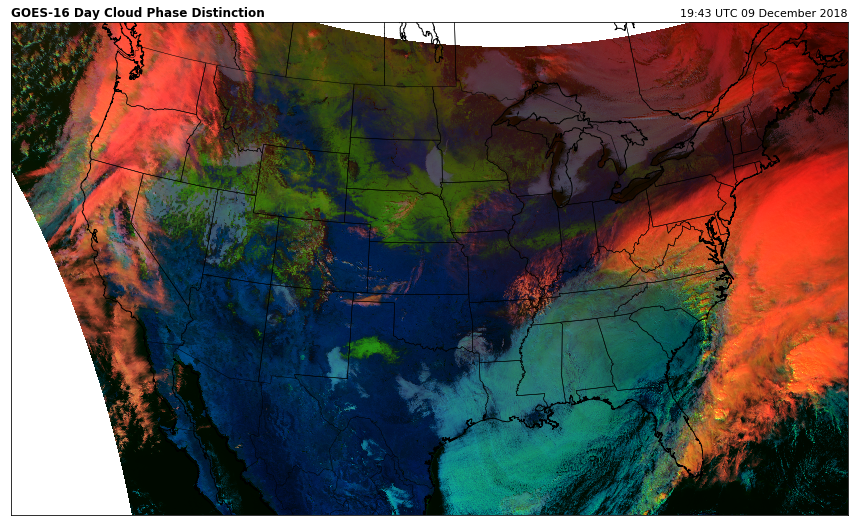

In [29]:
# An example of calling the cloudphase function in the 'main' script
cloudphase(file)

I save the last x amount of images for processing into an animated gif, so I use the mv command to rename the existing files as shown below. I use the os module, to which you can pass the same commands you would type on the command line. 

In [ ]:
# Change the names/overwrite previous files
import os
os.chdir('/home/kschneider/Documents/goes16/Images/snowcover') # Directory containing images
band='snowcover'
images=20
last_image = band + str(images) + '.png'
command = 'rm ' + last_image # Removing the last image in the folder to maintain same number of images
os.system(command)
for num in range(0,(images-1)): # Files are numbered snowcover#.png where # ranges from 0 to images (20)
    newfname = band + str(images-num) + '.png' 
    oldfname = band + str(images-(num+1)) + '.png'
    command = 'mv ' + oldfname + ' ' + newfname # Example: snowcover1.png --> snowcover2.png
    os.system(command)
os.chdir('/home/kschneider') # Change back to directory containing netcdf file

### Important to do this step BEFORE creating a new snowcover1.png

Now, we can create a gif of the images. As they are numbered 1 to 20, with 1 being the most recent image, the gif will be creatd in the correct order. 

In [ ]:
# Making a gif

import os
import imageio

png_dir = '/home/kschneider/Documents/goes16/Images/snowcover'
os.chdir(png_dir)

images = []
for file_name in os.listdir(png_dir):
    if file_name.endswith('.png'):
        file_path = os.path.join(png_dir, file_name)
        images.append(imageio.imread(file_path))
imageio.mimsave('../snowcover.gif', images, fps=5) 
# I save my gifs in a different folder so they can be easily captured with put * (shown later)

### Automating the generation of sub-region plots
It's useful to be able to also generate plots of sub-regions. How do we do this all in the same script? We can compactly generate plots of these regions by utilizing python dictionaries. All we have to do is choose a basemap projection that lets us specify lat/lon extents, and then iterate thru a dictionary containing them.

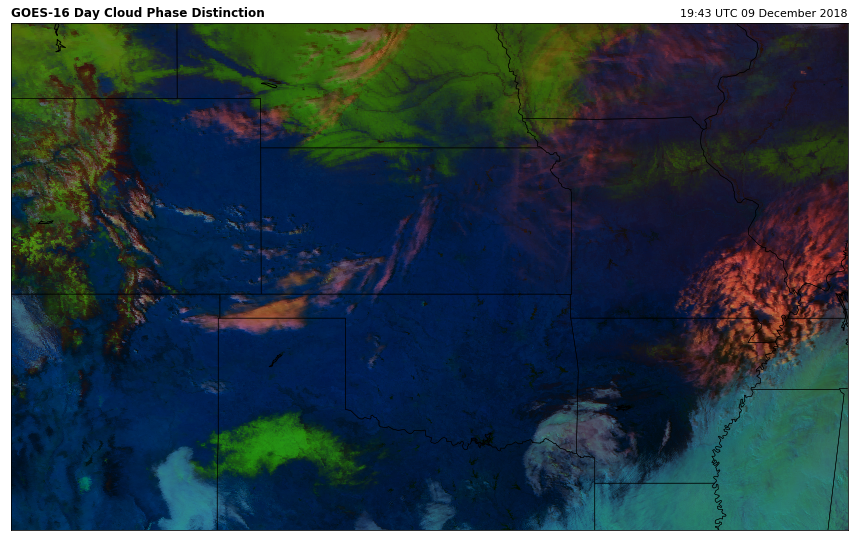

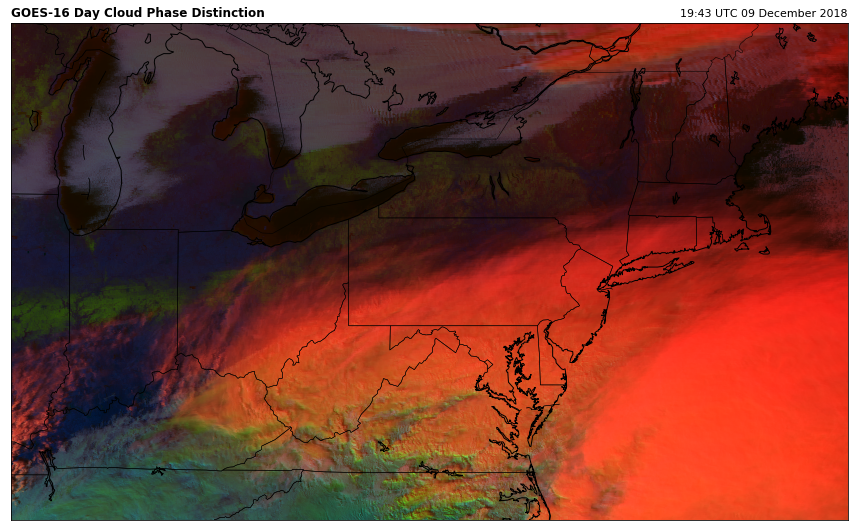

In [33]:
# Script to make gifs of sub-sections

# For the sub-sections, I will use the Miller Cylindrical projection. It requires:
# m = Basemap(projection='mill',llcrnrlat=-90,urcrnrlat=90,\
             #llcrnrlon=-180,urcrnrlon=180,resolution='c')
    
# Make a dictionary to hold llc and urc lat and lon
# [llcrnrlat, urcrnrlat, llcrnrlon, urcrnrlon]
domains = {'Mid-Atlantic': [35.5, 46, -89, -68], 'Central Plains': [32, 42.5, -108, -88]}

# Iterate thru the dictionary to plot the sub-sectors
for key, value in domains.iteritems():
    sector = key
    lat0 = value[0]
    lat1 = value[1]
    lon0 = value[2]
    lon1 = value[3]
    m = Basemap(projection='mill',llcrnrlat=lat0,urcrnrlat=lat1,\
            llcrnrlon=lon0,urcrnrlon=lon1,resolution='i')
    # Plot the image
    plt.figure(figsize=[15,12])
    newmap = m.pcolormesh(lons, lats, R, color=colorTuple, linewidth=0, latlon=True)
    newmap.set_array(None)
    m.drawcoastlines()
    m.drawcountries()
    m.drawstates()

    plt.title('GOES-16 Day Cloud Phase Distinction', fontweight='semibold', fontsize=12, loc='left')
    plt.title('%s' % DATE.strftime('%H:%M UTC %d %B %Y'), fontsize=11, loc='right')
    
    # Saving the figs according to naming convention desired
    import os
    os.chdir('/home/kschneider/Documents/goes16')
    fig_name = 'cloudphase' + sector + '1.png'
    plt.savefig(fig_name, bbox_inches='tight')
    

### Automatically upload files to the web
There are many ways to do this, including python libraries, but to upload to my personal web space, sftp (secure FTP) protocol is required. Unfortunately, I was not able to get a python module installed that would do this (there are some available, but contained a lot of bugs). However, I was able to write a fairly compact shell script to do the trick, and call the script using subprocess. The shell script uses expect (yum install expect); google search should yield more info about it. 

In [ ]:
#!/usr/bin/expect

set timeout 300
spawn sftp [USERNAME]@ftp.[SERVER]
expect "[USERNAME]@ftp.[SERVER]'s password:"
send "[PASSWORD HERE]\n"
expect "sftp>"
send "cd [IMAGE DESTINATION]\n"
expect "sftp>"
send "lcd [YOUR IMAGE DIRECTORY]\n"
expect "sftp>"
send "put *\n"
expect "sftp>"
send "exit\n"
interact

In [ ]:
# Call the shell script in Python
import os
os.chdir('/home/kschneider/Documents/goes16')
import subprocess
subprocess.call(['./upload.sh'])

# The Result:
Using some html/javascript to create the mouse-over capability on the webpage, we have:

http://personal.psu.edu/kps5442/
 (best viewed in the daytime hours)

I hope you enjoyed this project and learned a thing or two about python and the GOES-16 data available today!